<a href="https://colab.research.google.com/github/78-t0b1/26-Weeks-Of-Data-Science/blob/master/MAsk_Detection_Using_RESNET.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import files

!pip install -q kaggle

In [3]:
# Upload kaggle API key file
uploaded = files.upload()

Saving kaggle.json to kaggle.json


In [7]:
!mkdir ~/.kaggle
!cp /content/kaggle.json ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [8]:
!kaggle datasets download -d vtech6/medical-masks-dataset

medical-masks-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [9]:
!unzip /content/medical-masks-dataset.zip 

Archive:  /content/medical-masks-dataset.zip
replace images/-1x-1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace images/-I1-MS09uaqsLdGTFkgnS0Rcg1mmPyAj95ySg_eckoM.jpeg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [11]:
!nvidia-smi

Sat May 23 12:45:33 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8    31W / 149W |      0MiB / 11441MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [40]:
!pip install xmltodict
import os
import cv2
import matplotlib.pyplot as plt
import xmltodict
import random
import numpy as np
import pandas as pd
from tensorflow import keras
import seaborn as sns
import numpy as np
import tensorflow as tf
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from pandas.plotting import register_matplotlib_converters
from sklearn.model_selection import train_test_split
import urllib
import os
import csv
import cv2
import time
from PIL import Image



In [13]:
tf.__version__

'2.2.0'

In [14]:
!pip install --upgrade keras

Requirement already up-to-date: keras in /usr/local/lib/python3.6/dist-packages (2.3.1)


In [15]:
!git clone https://github.com/fizyr/keras-retinanet.git

Cloning into 'keras-retinanet'...
remote: Enumerating objects: 31, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 5736 (delta 12), reused 14 (delta 5), pack-reused 5705
Receiving objects: 100% (5736/5736), 13.37 MiB | 25.36 MiB/s, done.
Resolving deltas: 100% (3843/3843), done.


In [16]:
%cd keras-retinanet/

!pip install .

/content/keras-retinanet
Processing /content/keras-retinanet
  Created wheel for keras-retinanet: filename=keras_retinanet-0.5.1-cp36-cp36m-linux_x86_64.whl size=169020 sha256=98413f6a98a120095373987f089fc570c34575cc83d016a9990d4ba41925d721
  Stored in directory: /root/.cache/pip/wheels/b2/9f/57/cb0305f6f5a41fc3c11ad67b8cedfbe9127775b563337827ba
  Created wheel for keras-resnet: filename=keras_resnet-0.1.0-py2.py3-none-any.whl size=13346 sha256=27107a65b11145ffbfd79fe6b4fb1cd7ce1cf2fc6d99f348d9e74d202b24035c
  Stored in directory: /root/.cache/pip/wheels/80/dd/ac/842235b63dddac12faa4b48ebe58b8944e8c2e57c2e38dddb6
Successfully built keras-retinanet keras-resnet


In [17]:
!python setup.py build_ext --inplace

running build_ext
cythoning keras_retinanet/utils/compute_overlap.pyx to keras_retinanet/utils/compute_overlap.c
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/keras-retinanet/keras_retinanet/utils/compute_overlap.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'keras_retinanet.utils.compute_overlap' extension
creating build
creating build/temp.linux-x86_64-3.6
creating build/temp.linux-x86_64-3.6/keras_retinanet
creating build/temp.linux-x86_64-3.6/keras_retinanet/utils
x86_64-linux-gnu-gcc -pthread -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/include/python3.6m -I/usr/local/lib/python3.6/dist-packages/numpy/core/include -c keras_retinanet/utils/compute_overlap.c -o build/temp.linux-x86_64-3.6/keras_retinanet/utils/compute_over

In [18]:
%cd ..

/content


In [0]:
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

In [0]:
!mkdir files


In [0]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

register_matplotlib_converters()
sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 22, 10

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)


In [0]:
def get_path(image_name):
    home_path = '/content/'
    image_path = home_path + 'images/' + image_name
    
    if image_name[-4:] == 'jpeg':
        label_name = image_name[:-5] + '.xml'
    else:
        label_name = image_name[:-4] + '.xml'
    
    label_path = home_path + 'labels/' + label_name
        
    return  image_path, label_path

In [0]:
def parse_xml(label_path):
    x = xmltodict.parse(open(label_path , 'rb'))
    item_list = x['annotation']['object']
    
    # when image has only one bounding box
    if not isinstance(item_list, list):
        item_list = [item_list]
        
    result = []
    
    for item in item_list:
        ans = item['name']
        bndbox = [(int(item['bndbox']['xmin']), int(item['bndbox']['ymin'])),
                  (int(item['bndbox']['xmax']), int(item['bndbox']['ymax']))]       
        result.append((ans, bndbox))
    
    size = [int(x['annotation']['size']['width']), 
            int(x['annotation']['size']['height'])]
    
    return result, size

In [0]:
def row_gen(image_path,bndbox,ans):
    x1 = bndbox[0][0]
    x2 = bndbox[1][0]
    y1 = bndbox[0][1]
    y2 = bndbox[1][1]
    return f'{image_path},{x1},{y1},{x2},{y2},{ans}'

In [0]:
def create_csv():
    img_list = os.listdir('/content/images')
    with open('files/annotation.txt','w+') as a:
        for i in img_list:
            image_path,label_path = get_path(i)
            results,size = parse_xml(label_path)
            for result in results:
                (ans,bndbox) = result
                annot = row_gen(image_path,bndbox,ans)
                a.write(annot+'\n')
            
    ann_txt = pd.read_csv(r'files/annotation.txt',header=None)     
    ann_txt.columns = ['image_path','x1','y1','x2','y2','class_name']
    ann_txt.to_csv(r'files/annotation.csv',index=None )
    
    d = {'class_name':['good','none','bad'],'id':[0,1,2]}
    mapping = pd.DataFrame(data=d)
    mapping.to_csv(r'files/classes.csv',index=None)
    
    
create_csv()
        

In [26]:
df_class = pd.read_csv('files/classes.csv')
df_class.head()
df_class.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   class_name  3 non-null      object
 1   id          3 non-null      int64 
dtypes: int64(1), object(1)
memory usage: 176.0+ bytes


In [27]:
df_annot = pd.read_csv('files/annotation.csv')
df_annot.head()


,image_path,x1,y1,x2,y2,class_name
0,/content/images/mfile_1505052_1_L_202001271043...,547,223,741,450,good
1,/content/images/694940094001_6126793304001_612...,871,153,931,227,good
2,/content/images/694940094001_6126793304001_612...,709,135,783,216,good
3,/content/images/694940094001_6126793304001_612...,99,177,193,294,good
4,/content/images/694940094001_6126793304001_612...,255,221,398,393,good


In [28]:
df_annot['class_name'].value_counts()

good    3121
bad      667
none     126
Name: class_name, dtype: int64

In [0]:
def visualize_image(image_name, bndbox=True):
    image_path, label_path = get_path(image_name)
    
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    if bndbox:
        labels, size = parse_xml(label_path)
        thickness = int(sum(size)/400.)
        
        for label in labels:
            name, bndbox = label
            
            if name == 'good':
                cv2.rectangle(image, bndbox[0], bndbox[1], (0, 255, 0), thickness)
            elif name == 'bad':
                cv2.rectangle(image, bndbox[0], bndbox[1], (255, 0, 0), thickness)
            else: # name == 'none'
                cv2.rectangle(image, bndbox[0], bndbox[1], (0, 0, 255), thickness)
    
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.axis('off')
    plt.title(image_name)
    plt.imshow(image)
    plt.show()

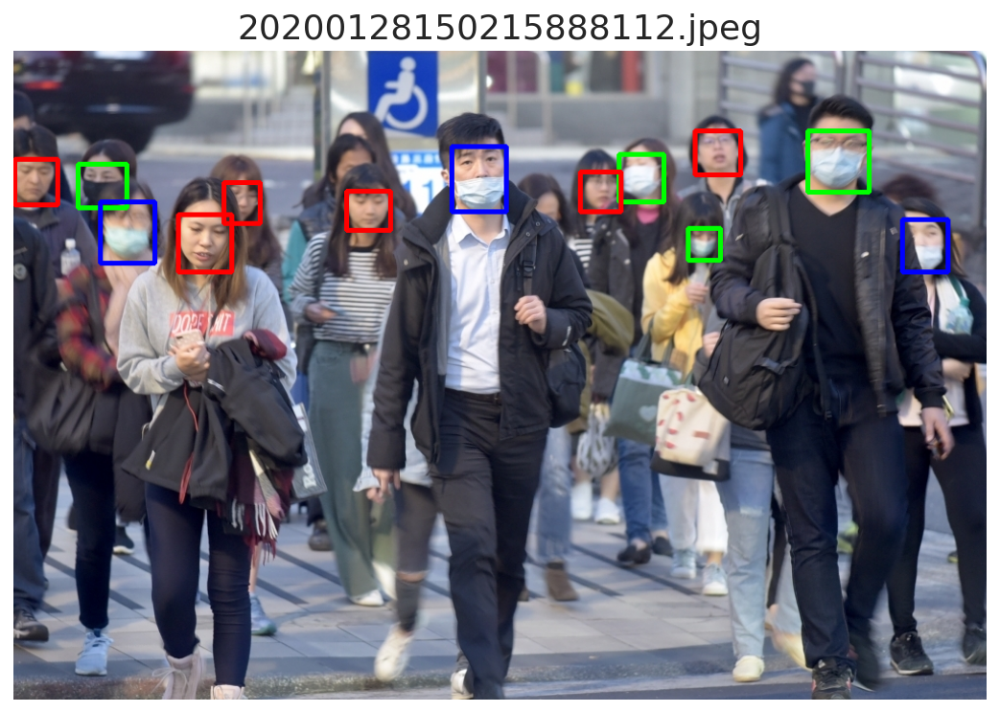

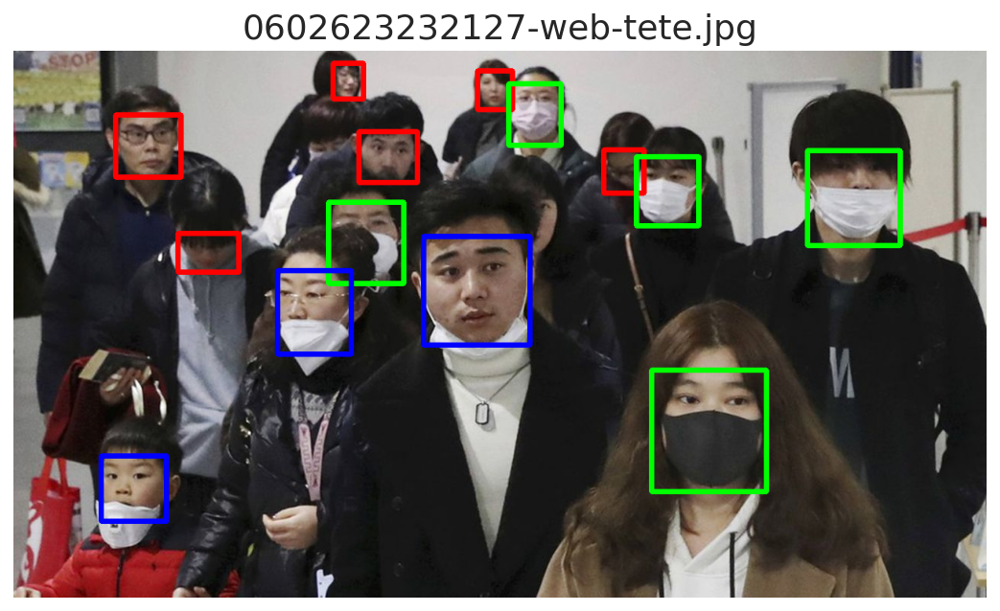

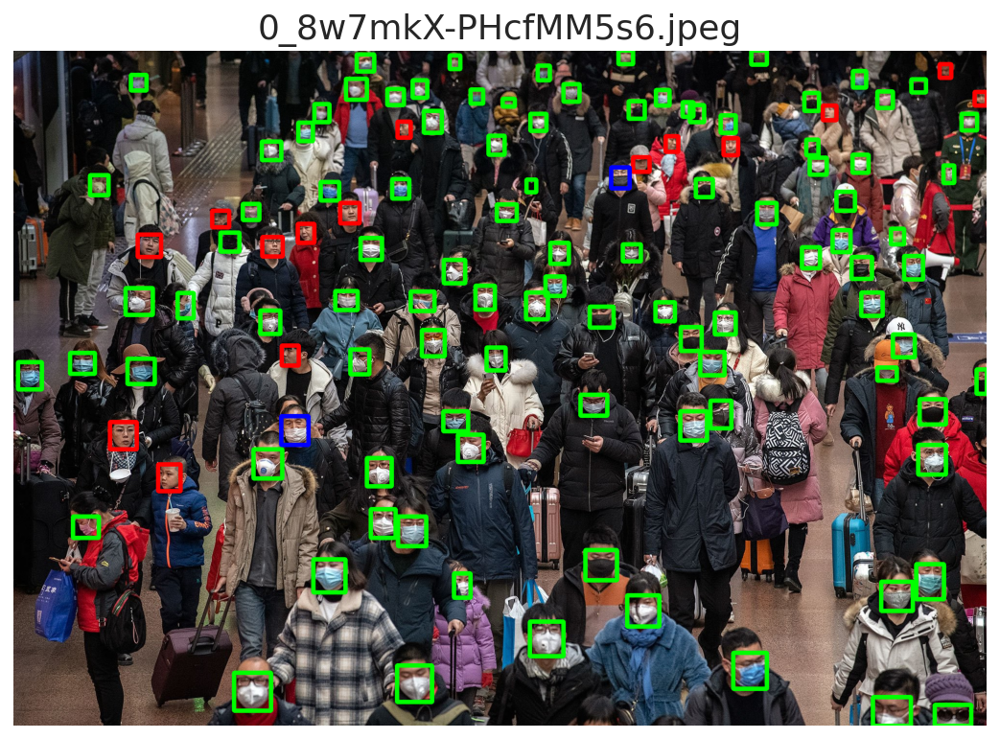

In [30]:
names = ['20200128150215888112.jpeg', '0602623232127-web-tete.jpg', '0_8w7mkX-PHcfMM5s6.jpeg']

for name in names:
    visualize_image(name)

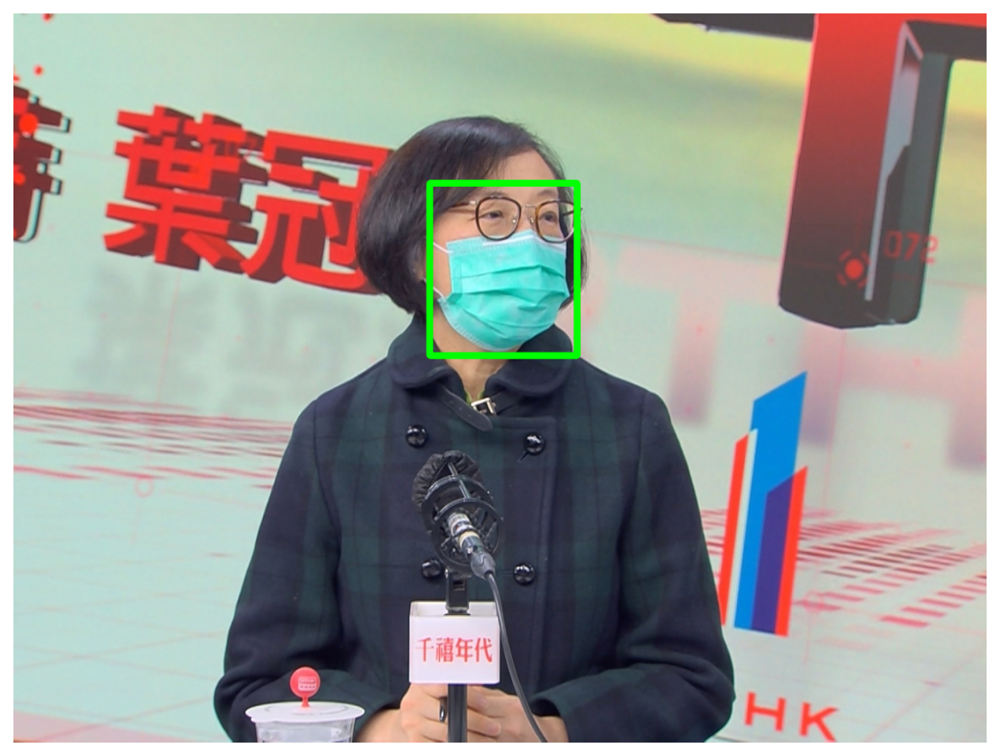

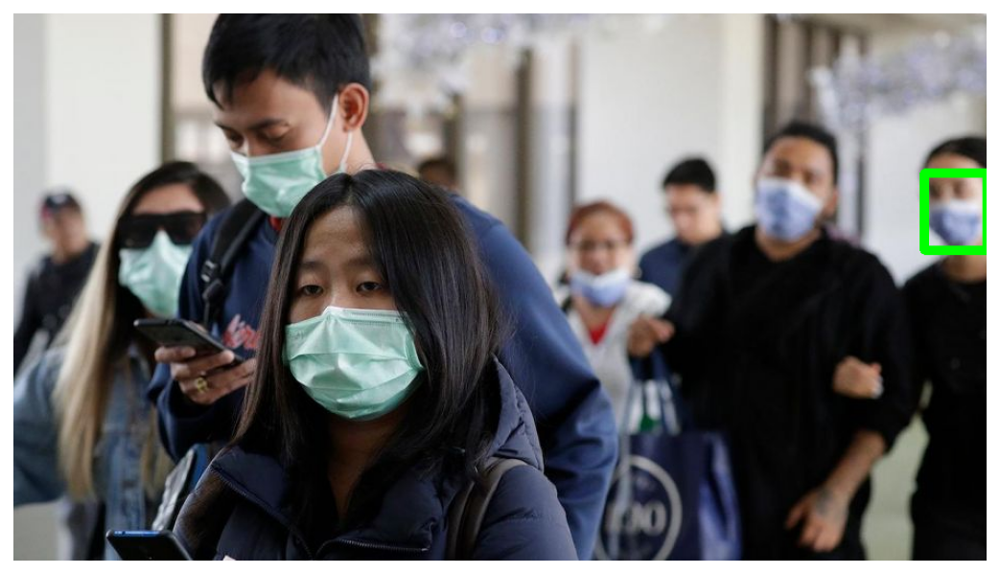

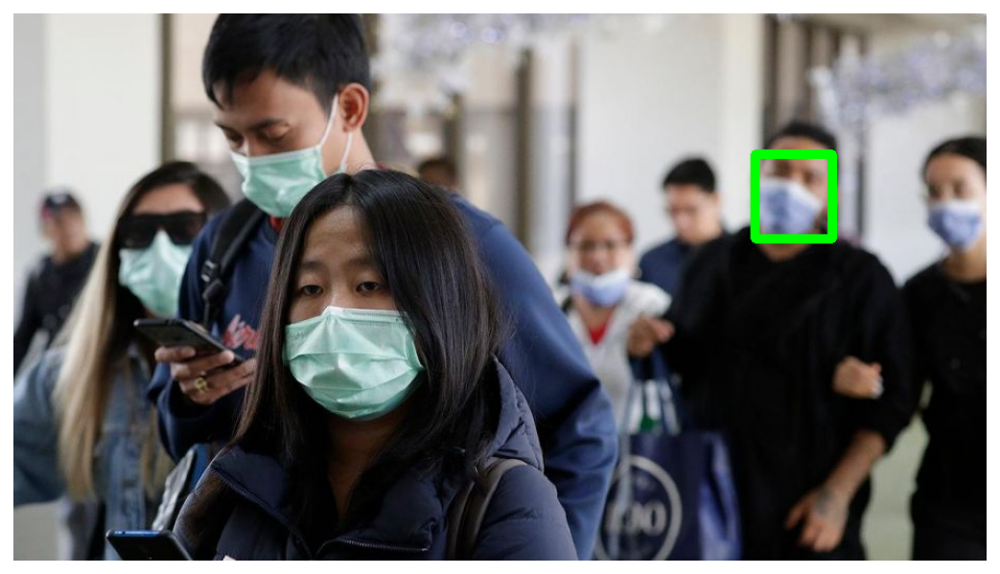

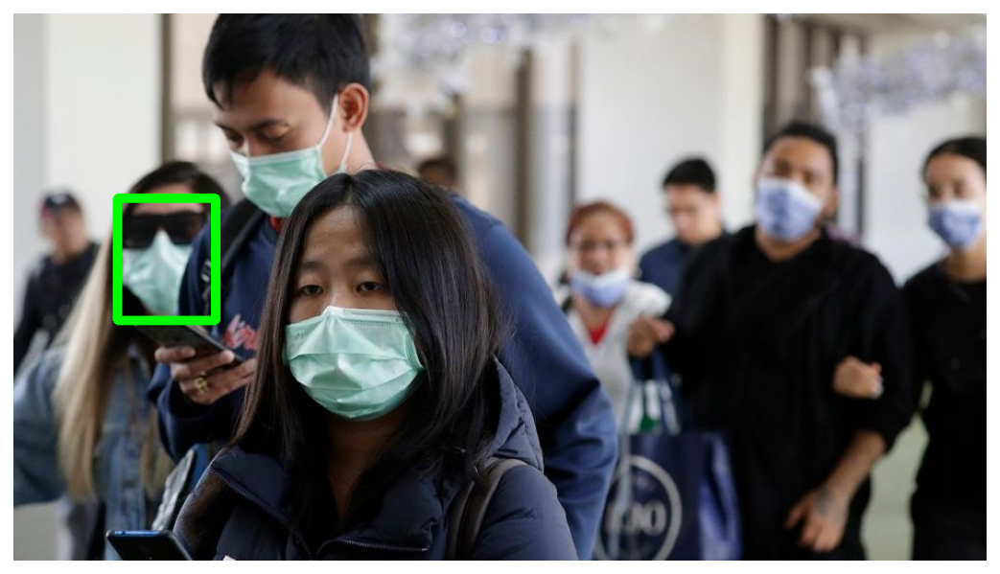

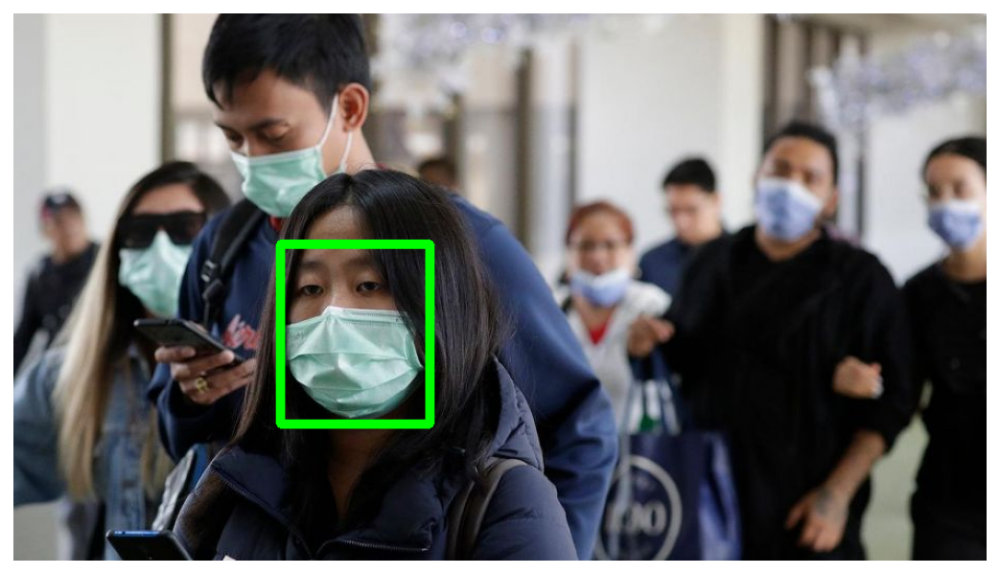

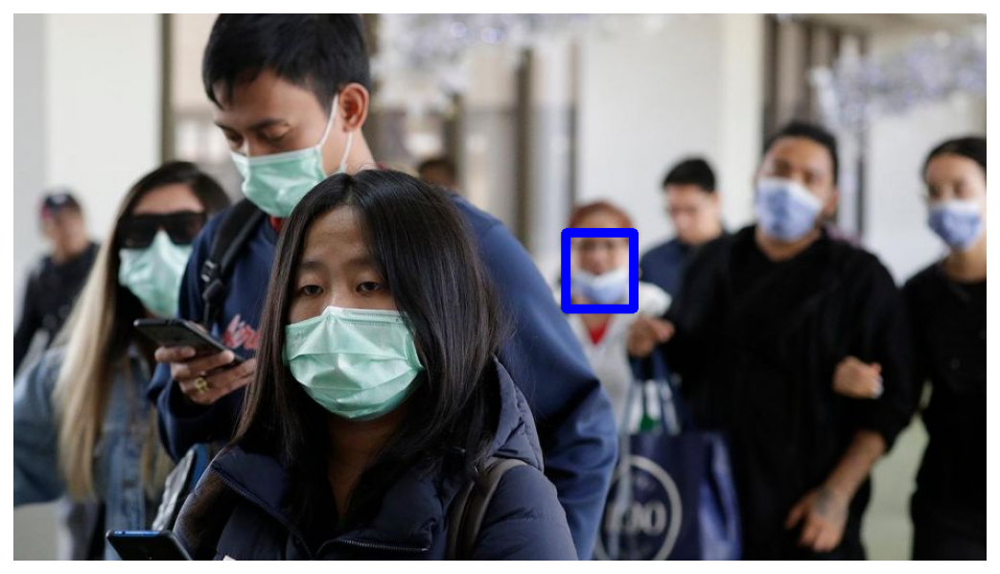

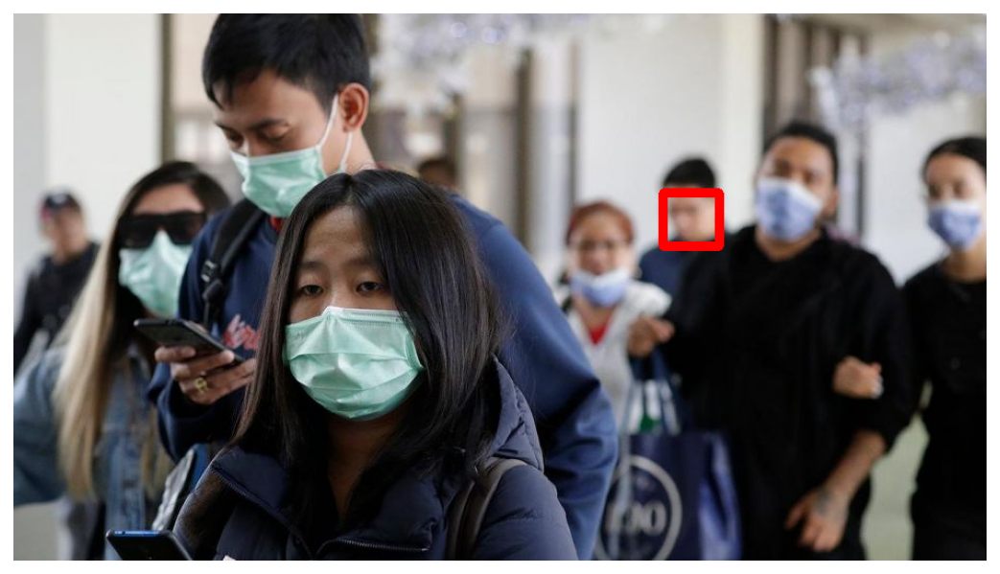

In [31]:
for n in range(7):
    img_inf = df_annot.iloc[n]
    image = cv2.imread(img_inf['image_path'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    bndbox = [(img_inf.x1,img_inf.y1),(img_inf.x2,img_inf.y2)]

    thickness = 8
    if img_inf['class_name'] == 'good':
        cv2.rectangle(image, bndbox[0], bndbox[1], (0, 255, 0), thickness)
    elif img_inf['class_name'] == 'bad':
        cv2.rectangle(image, bndbox[0], bndbox[1], (255, 0, 0), thickness)
    else: # name == 'none'
        cv2.rectangle(image, bndbox[0], bndbox[1], (0, 0, 255), thickness)


    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.axis('off')
    plt.imshow(image)
    plt.show()

In [0]:
train_df, test_df = train_test_split(
  df_annot, 
  test_size=0.2, 
  random_state=42
)

In [0]:
train_df.to_csv('files/annotation_train.csv', index=False, header=None)
df_class.to_csv('files/classes_train.csv', index=False, header=None)

In [34]:
tr = pd.read_csv('files/annotation_train.csv')
tr.head()

,/content/images/mfile_1505052_1_L_20200127104344.jpg,547,223,741,450,good
0,/content/images/c1_1844849.jpg,269,210,376,349,none
1,/content/images/CHINA-VIRUS-TRAVEL-1-SOC.jpg,809,237,834,255,good
2,/content/images/9a97c47e58ca6324cc0feaef3ef25c...,4351,870,4451,1000,good
3,/content/images/China-coronavirus-9.jpg,418,140,488,210,none
4,/content/images/Getty_Beijing-Air-Pollution_we...,1184,175,1309,302,bad


In [0]:
!cd ..

In [0]:
!mkdir epochs

In [37]:
!ls 

epochs	images	     keras-retinanet  medical-masks-dataset.zip
files	kaggle.json  labels	      sample_data


In [38]:
PRETRAINED_MODEL = 'epochs/_pretrained_model.h5'

URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to epochs/_pretrained_model.h5


In [39]:
!keras-retinanet/keras_retinanet/bin/train.py --freeze-backbone --random-transform --weights {PRETRAINED_MODEL} --batch-size 10 --steps 1000 --epochs 10 csv files/annotation_train.csv files/classes_train.csv

Using TensorFlow backend.
2020-05-23 12:46:43.476611: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Creating model, this may take a second...
2020-05-23 12:46:45.665258: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-05-23 12:46:45.721289: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-05-23 12:46:45.722112: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2020-05-23 12:46:45.722157: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
20

In [45]:
 model_path = os.path.join('snapshots', sorted(os.listdir('snapshots'), reverse=True)[0])
print(model_path)

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

labels_to_names = pd.read_csv('files/classes_train.csv', header=None).T.loc[0].to_dict()

snapshots/resnet50_csv_05.h5
tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-22.627417, -11.313708,  22.627417,  11.313708],
       [-28.50876 , -14.25438 ,  28.50876 ,  14.25438 ],
       [-35.918785, -17.959393,  35.918785,  17.959393],
       [-16.      , -16.      ,  16.      ,  16.      ],
       [-20.158737, -20.158737,  20.158737,  20.158737],
       [-25.398417, -25.398417,  25.398417,  25.398417],
       [-11.313708, -22.627417,  11.313708,  22.627417],
       [-14.25438 , -28.50876 ,  14.25438 ,  28.50876 ],
       [-17.959393, -35.918785,  17.959393,  35.918785]], dtype=float32)> anchors
tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-45.254833, -22.627417,  45.254833,  22.627417],
       [-57.01752 , -28.50876 ,  57.01752 ,  28.50876 ],
       [-71.83757 , -35.918785,  71.83757 ,  35.918785],
       [-32.      , -32.      ,  32.      ,  32.      ],
       [-40.317474, -40.317474,  40.317474,  40.317474],
       [

In [0]:
def predict(image):
  image = preprocess_image(image.copy())
  image, scale = resize_image(image)

  boxes, scores, labels = model.predict_on_batch(
    np.expand_dims(image, axis=0)
  )

  boxes /= scale

  return boxes, scores, labels

300
********************
300
********************
300
2
0.7170063
[(182.8371, 72.0804), (242.37979, 135.03241)]
2
0.70109373
[(224.1634, 184.82466), (316.07803, 284.07715)]
0
0.67288697
[(94.79906, 163.4303), (188.73132, 267.27594)]
0
0.63692546
[(812.59186, 123.6146), (880.4461, 192.60498)]
0
0.6253484
[(289.095, 326.3524), (401.1369, 443.7111)]
0
0.6065449
[(242.86716, 81.47481), (286.0285, 128.8327)]
0
0.599472
[(99.37963, 58.04103), (144.47484, 98.038666)]
2
0.5970723
[(326.08627, 164.67632), (392.48138, 242.60312)]
0
0.59580004
[(356.97476, 72.61413), (398.06497, 108.762344)]
0
0.5930271
[(650.767, 185.4946), (717.6454, 237.1126)]
2
0.58202165
[(612.72534, 118.46358), (645.79114, 171.48112)]
0
0.58149445
[(401.24042, 320.4944), (491.59854, 404.58328)]
0
0.559358
[(757.7617, 38.726902), (791.68396, 88.6305)]
0
0.55144423
[(520.9437, 286.7912), (656.59875, 427.5153)]
0
0.5471495
[(8.329036, 82.958466), (60.749935, 150.41803)]
2
0.53770095
[(457.2747, 45.816326), (497.31906, 86.93878

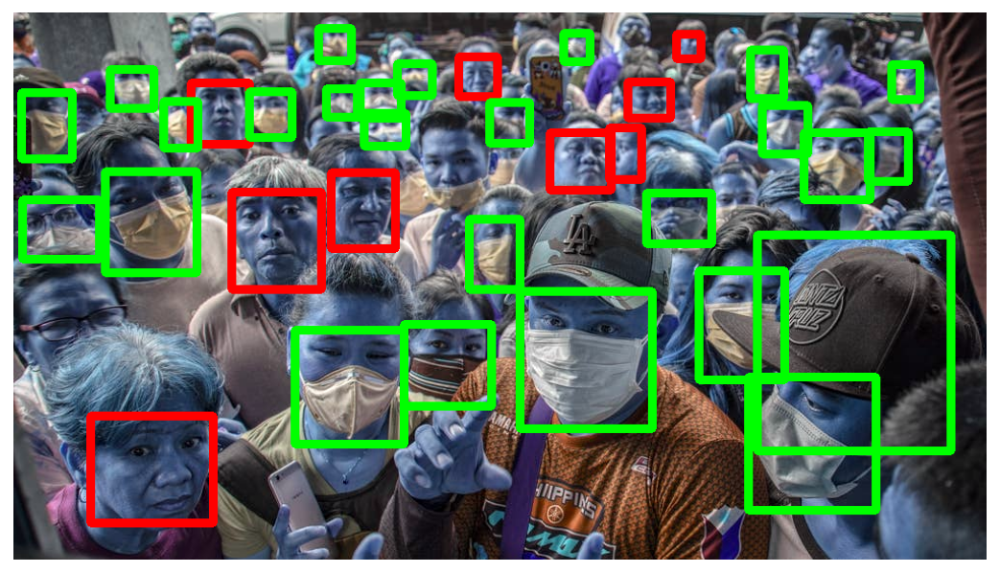

In [65]:
THRES_SCORE = 0.4
def draw_dect(img_name):
    image_path, label_path = get_path(img_name)
    image = cv2.imread(image_path)
    box, score, label = predict(image)
    print(len(box[0]))
    print('*'*20)
    print(len(score[0]))
    print('*'*20)
    print(len(label[0]))
    
    boxes = box[0]
    scores = score[0]
    labels = label[0]
   
    for n in range(len(scores)):
        if scores[n]>THRES_SCORE:
            
            print(labels[n])
            print(scores[n])
            bndbox = [(boxes[n][0],boxes[n][1]),(boxes[n][2],boxes[n][3])]
            print(bndbox)
            if labels[n] == 0:
                cv2.rectangle(image, bndbox[0], bndbox[1], (0, 255, 0), thickness)
            elif labels[n] == 2:
                cv2.rectangle(image, bndbox[0], bndbox[1], (255, 0, 0), thickness)
            else: # name == 'none'
                cv2.rectangle(image, bndbox[0], bndbox[1], (0, 0, 255), thickness)
                
        else :
            pass
        
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.axis('off')
    plt.imshow(image)
    plt.show()


draw_dect('China-coronavirus-9.jpg')

In [62]:
test_df.head()
name = test_df.iloc[36]['image_path']
name

'/content/images/China-coronavirus-9.jpg'